## 2. Choosing the right estimator/algorithm for your problem

Once you've got your data ready, the next step is to choose an appropriate machine learning algorithm or model to find patterns in your data.

Some things to note:

- Scikit-Learn refers to machine learning models and algorithms as estimators.
- **Classification problem** - predicting a category (heart disease or not).
  - Sometimes you'll see `clf` (short for classifier) used as a classification estimator instance's variable name.
- **Regression problem** - predicting a number (selling price of a car).
- **Unsupervised problem (data with no labels)** - clustering (grouping unlabelled samples with other similar unlabelled samples).

If you know what kind of problem you're working with, one of the next places you should look at is the [Scikit-Learn algorithm cheatsheet](https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html).

This cheatsheet gives you a bit of an insight into the algorithm you might want to use for the problem you're working on.

It's important to remember, you don't have to explicitly know what each algorithm is doing on the inside to start using them.

If you start to apply different algorithms but they don't seem to be working (not performing as well as you'd like), that's when you'd start to look deeper into each one.

Let's check out the cheatsheet and follow it for some of the problems we're working on.

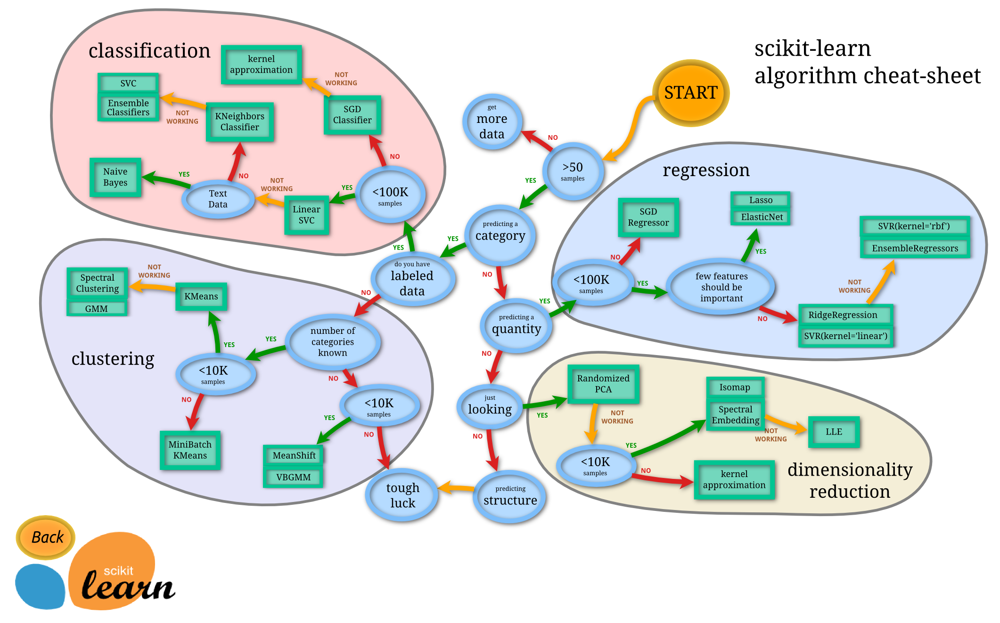

You can see it's split into four main categories. Regression, classification, clustering and dimensionality reduction. Each has their own different purpose but the Scikit-Learn team has designed the library so the workflows for each are relatively similar.


### 2.1 Picking a machine learning model for a regression problem

Let's start with a regression problem (trying to predict a number). We'll use the [California Housing dataset](https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset) built into Scikit-Learn's `datasets` module.

The goal of the California Housing dataset is to predict a given district's median house value (in hundreds of thousands of dollars) on things like the age of the home, the number of rooms, the number of bedrooms, number of people living the home and more.


In [1]:
# Get California Housing dataset
from sklearn.datasets import fetch_california_housing
housing = fetch_california_housing()
housing; # gets downloaded as dictionary

In [5]:
#Since it's in a dictionary, let's turn it into a DataFrame so we can inspect it better.
housing_df = pd.DataFrame(housing["data"], columns=housing["feature_names"])
housing_df["target"] = pd.Series(housing["target"])
housing_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [6]:
# How many samples?
len(housing_df)

20640

Beautiful, our goal here is to use the feature columns, such as:

- `MedInc` - median income in block group
- `HouseAge` - median house age in block group
- `AveRooms` - average number of rooms per household
- `AveBedrms` - average number of bedrooms per household

To predict the `target` column which expresses the median house value for specfici California districts in hundreds of thousands of dollars (e.g. 4.526 = $452,600).

In essence, each row is a different district in California (the data) and we're trying to build a model to predict the median house value in that distract (the target/label) given a series of attributes about the houses in that district.

Since we have data and labels, this is a supervised learning problem.

And since we're trying to predict a number, it's a regression problem.

Knowing these two things, how do they line up on the Scikit-Learn machine learning algorithm cheat-sheet?

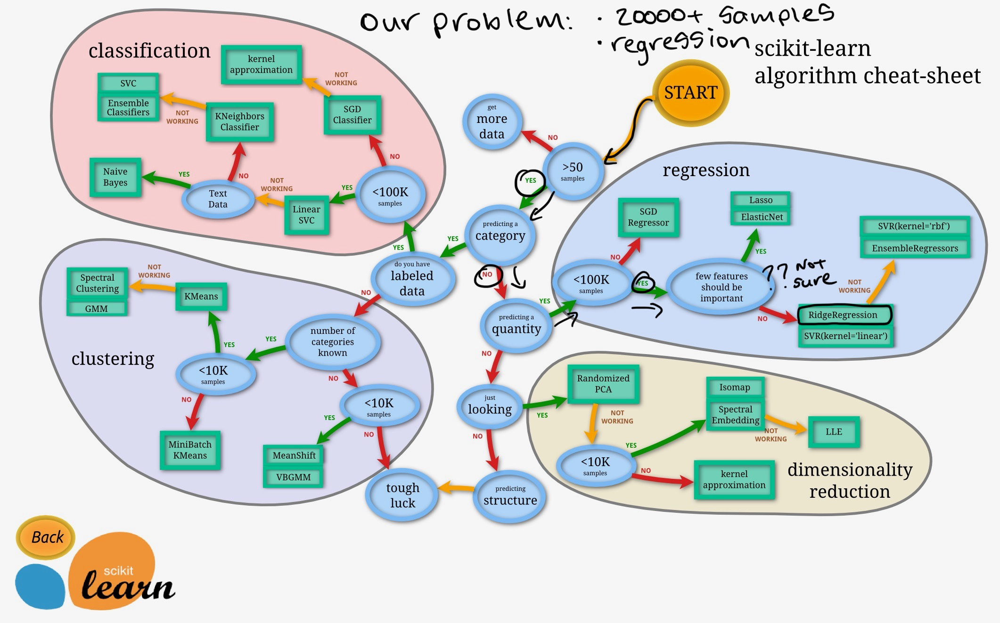

Following the map through, knowing what we know, it suggests we try [`RidgeRegression`](https://scikit-learn.org/stable/modules/linear_model.html#ridge-regression). Let's chek it out.


In [10]:
# Import the Ridge model class from the linear_model module
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
# Setup random seed
np.random.seed(42)

# Split the data into features (X) and labels (y)
X = housing_df.drop("target", axis=1)
y = housing_df["target"]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Institate and fit the model (on the training set)
model = Ridge()
model.fit(X_train, y_train)

# Check the score of the model (on the test set)
# The default score() metirc of regression aglorithms is R^2
model.score(X_test, y_test)

0.5758549611440126

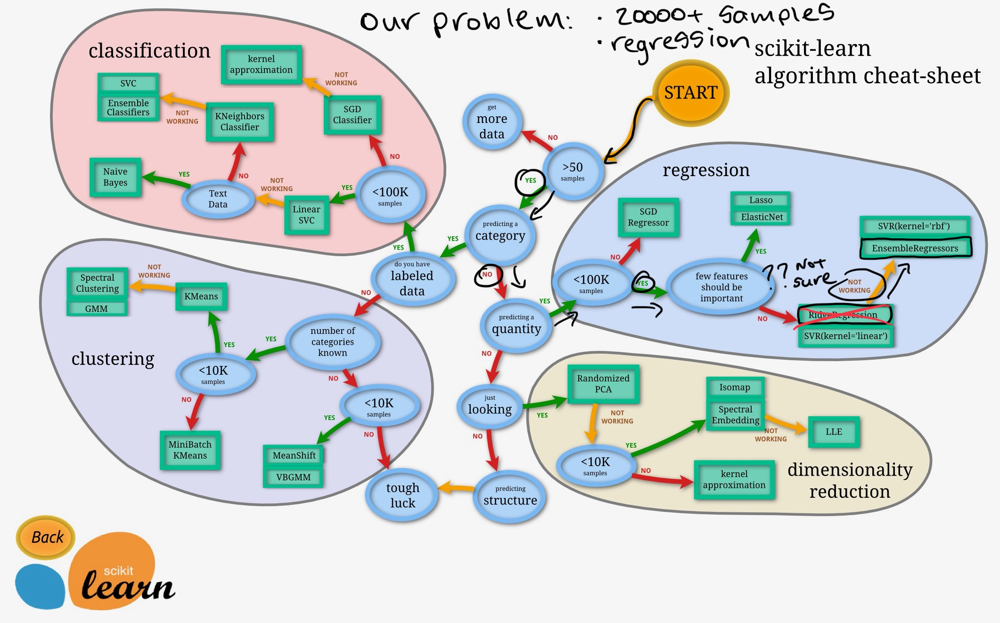


Following the diagram, the next step would be to try EnsembleRegressors.

Ensemble is another word for multiple models put together to make a decision.

One of the most common and useful ensemble methods is the Random Forest. Known for its fast training and prediction times and adaptibility to different problems.

The basic premise of the Random Forest is to combine a number of different decision trees, each one random from the other and make a prediction on a sample by averaging the result of each decision tree.

An in-depth discussion of the Random Forest algorithm is beyond the scope of this notebook but if you're interested in learning more, An Implementation and Explanation of the Random Forest in Python by Will Koehrsen is a great read.

Since we're working with regression, we'll use Scikit-Learn's RandomForestRegressor.

We can use the exact same workflow as above. Except for changing the model.


In [11]:
# Import the RandomForestRegressor model class from the ensemble module
from sklearn.ensemble import RandomForestRegressor

# Setup random seed
np.random.seed(42)

# Split the data into features (X) and labels (y)
X = housing_df.drop("target", axis=1)
y = housing_df["target"]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Institate and fit the model (on the training set)
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Check the score of the model (on the test set)
# The default score metirc of regression aglorithms is R^2
model.score(X_test, y_test)

0.8065734772187598

We get a good boost in score on the test set by changing the model.

This is another incredibly important concept in machine learning, if at first something doesn't achieve what you'd like, experiment, experiment, experiment!

At first, the Scikit-Learn algorithm diagram can seem confusing.

But once you get a little practice applying different models to different problems, you'll start to pick up which sorts of algorithms do better with different types of data.


### 2.2 Picking a machine learning model for a classification problem

Now, let's check out the choosing process for a classification problem.

Say you were trying to predict whether or not a patient had heart disease based on their medical records.

The dataset in `../data/heart-disease.csv` (or at [`heart-disease.csv`](datasets\heart-disease.csv)) contains data for just that problem.


In [12]:
heart_disease = pd.read_csv("../datasets/heart-disease.csv") # load from local directory
heart_disease.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [13]:
# How many samples are there?
len(heart_disease)

303

Similar to the California Housing dataset, here we want to use all of the available data to predict the target column (1 for if a patient has heart disease and 0 for if they don't).

So what do we know?

We've got 303 samples (1 row = 1 sample) and we're trying to predict whether or not a patient has heart disease.

Because we're trying to predict whether each sample is one thing or another, we've got a classification problem.

Let's see how it lines up with our [Scikit-Learn algorithm cheat-sheet](https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html).

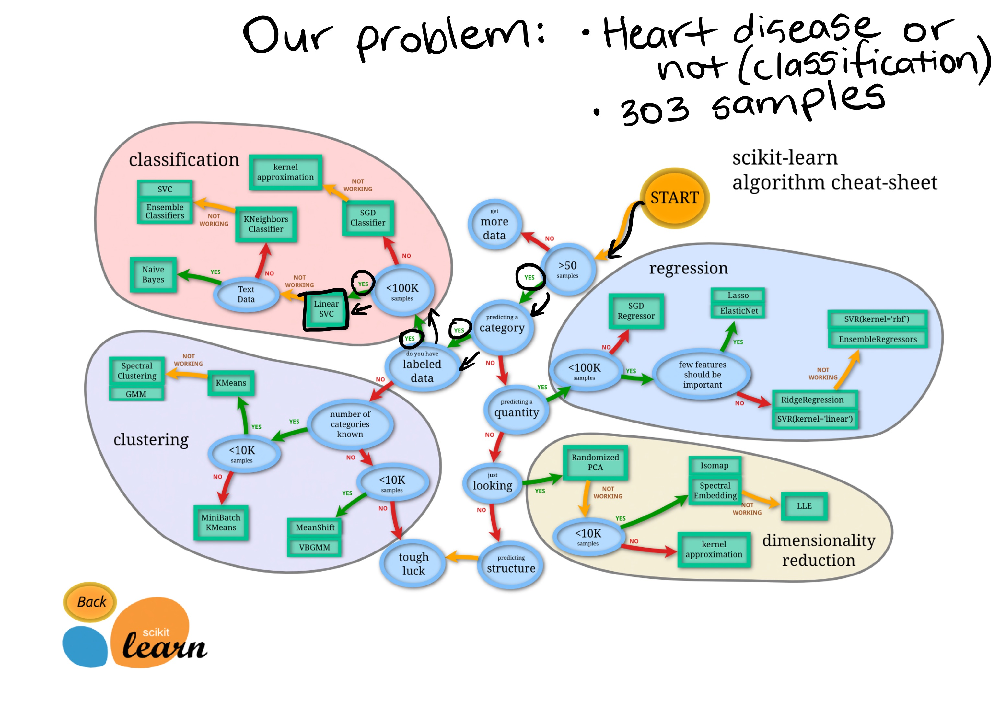

Following the cheat-sheet we end up at [`LinearSVC`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC) which stands for Linear Support Vector Classifier. Let's try it on our data.


In [15]:
# Import LinearSVC from the svm module
from sklearn.svm import LinearSVC

# Setup random seed
np.random.seed(42)

# Split the data into X (features/data) and y (target/labels)
X = heart_disease.drop("target", axis=1)
y = heart_disease["target"]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Instantiate and fit the model (on the training set)
clf = LinearSVC(max_iter=1000, # iterations on the data, 1000 is the default
                dual="auto") # dual="auto" chooses best parameters for the model automatically
clf.fit(X_train, y_train)

# Check the score of the model (on the test set)
clf.score(X_test, y_test)

0.8688524590163934

Straight out of the box (with no tuning or improvements) our model achieves over 85% accruacy!

Although this is a sensational result to begin with, let's check out the diagram and see what other models we might use.

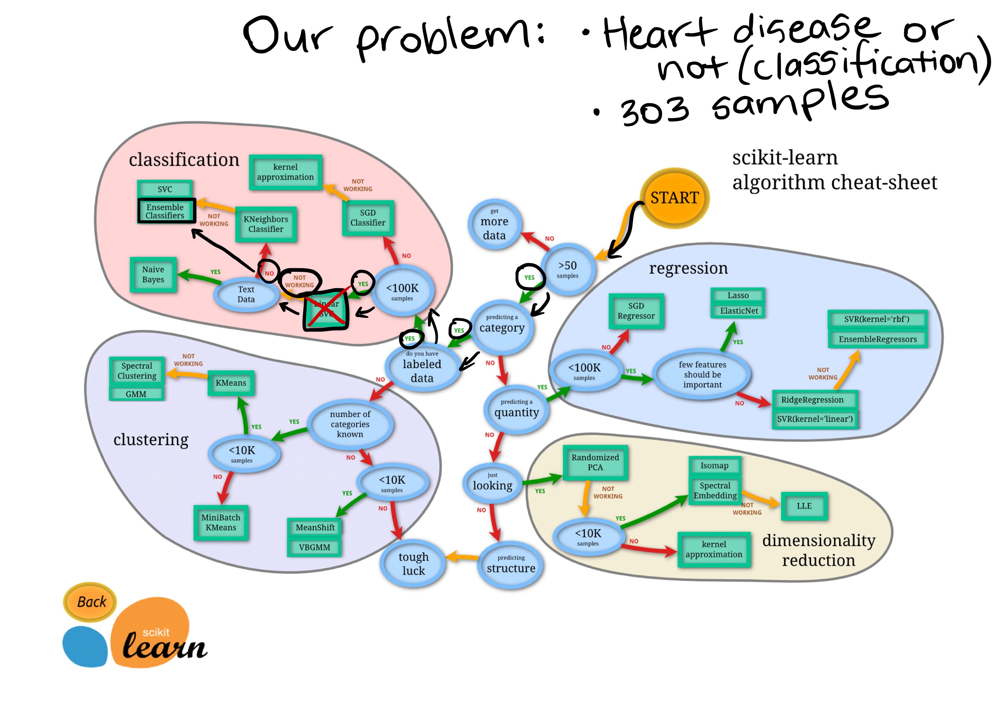

Following the path (and skipping a few, don't worry, we'll get to this) we come up to [`EnsembleMethods`](https://scikit-learn.org/stable/modules/ensemble.html) again.

Except this time, we'll be looking at ensemble classifiers instead of regressors.

Remember our [`RandomForestRegressor`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html) from above?

We'll it has a dance partner, [`RandomForestClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) which is an ensemble based machine model learning model for classification.

You might be able to guess what we can use it for (hint: classification problems).

Let's try!


In [16]:
# Import the RandomForestClassifier model class from the ensemble module
from sklearn.ensemble import RandomForestClassifier

# Setup random seed
np.random.seed(42)

# Split the data into X (features/data) and y (target/labels)
X = heart_disease.drop("target", axis=1)
y = heart_disease["target"]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Instantiate and fit the model (on the training set)
clf = RandomForestClassifier(n_estimators=100) # 100 is the default, but you could try 1000 and see what happens
clf.fit(X_train, y_train)

# Check the score of the model (on the test set)
clf.score(X_test, y_test)

0.8524590163934426

It looks like the default hyperparameters of `RandomForestClassifier` don't perform as well as `LinearSVC`.

Other than trying another classification model, we could start to run experiments to try and improve these models via [hyperparameter tuning](http://scikit-learn.org/stable/modules/grid_search.html).

Hyperparameter tuning is fancy term for adjusting some settings on a model to try and make it better.

It usually happens once you've found a decent baseline model that you'd like to improve upon.

In this case, we could take either the `RandomForestClassifier` or the `LinearSVC` and try and improve it with hyperparameter tuning (which we'll see later on).

For example, you could try and take the `n_estimators` parameter (the number of trees in the forest) of `RandomForestClassifier` and change it from `100` (default) to `1000` and see what happens.
